**Librarys**

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from pandas_profiling import ProfileReport
from typing import List
from dateutil.relativedelta import relativedelta

from fbprophet import Prophet

from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

import keras
from keras.models import Sequential
from keras.layers import Dense

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import shap

**Functions**

In [49]:
def date_features(train):
    # Features Temporais:

    # Hora - hour
    # Dia da semana, dia do mes, dia do ano - isocalenda()["day"], day, dayofwear
    # Semana do Ano - isocalendar()["week"]
    # Mes - month
    # Juncao de Mes, sazonalidade 4 meses - quarter
    # Ano - year

    train["hour"] = train.index.hour
    train["dow"]= train.index.isocalendar()['day'].astype("int64")
    train["dom"] = train.index.day
    # train["doy"] = train.index.dayofyear
    train["woy"] = train.index.isocalendar()['week'].astype("int64")
    train["month"] = train.index.month
    train["quarter"] = train.index.quarter
    train["year"] = train.index.isocalendar()['year'].astype("int64")

    train["date"] = train.index

    test["hour"] = test.index.hour
    test["dow"]= test.index.isocalendar()['day'].astype("int64")
    test["dom"] = test.index.day
    # test["doy"] = test.index.dayofyear
    test["woy"] = test.index.isocalendar()['week'].astype("int64")
    test["month"] = test.index.month
    test["quarter"] = test.index.quarter
    test["year"] = test.index.isocalendar()['year'].astype("int64")

    test["date"] = test.index
    
    return train

def remove_outliers(train):
    
    # Filter outliers

    # Q3 = np.quantile(train["electricity_consumption"], 0.75)
    # Q1 = np.quantile(train["electricity_consumption"], 0.25)
    # IQR = Q3 - Q1

    # train = train[train["electricity_consumption"] < (Q3 + 1.5* IQR)].copy()
    # train = train[train["electricity_consumption"] > (Q1 + 1.5* IQR)].copy()

    size_bef = train.shape[0]
    train = train[train["electricity_consumption"] < train.electricity_consumption.quantile(0.98)].copy()
    size_aft = train.shape[0]
    print(f"take out  {size_bef- size_aft} outliers")
    
    return train

def shift_cols(df, cols_2lag: List[str], lags: int):
    # Realiza o shift (lag) de uma coluna passada no numero de lags
    df = df.sort_index()
    lags = np.arange(1, lags+1).tolist()
    for column in cols_2lag:
        for lag in lags:
            df[f"{column}_lag_{lag}"] = df[column].shift(lag)
    return df


def ma_cols(df, cols_2ma: List[str], mas: int):
    # Realiza o shift (lag) de uma coluna passada no numero de lags
    df = df.sort_index()
    mas = np.arange(1, mas+1).tolist()
    for column in cols_2ma:
        for ma in mas:
            df[f"{column}_ma_{ma}"] = df[column].rolling(ma).mean()
    return df


def mean_absolute_percentage_error(y_true, y_pred, decimals=2):
    # Calcula o MAPE
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    mape = round(mape, decimals)
    print(mape)
    return mape


def grid_search(model, grid, X_train, y_train):
    # grid search for hiperparamns
    grid_search_result = model.grid_search(grid, 
                                           X=X_train, 
                                           y=y_train, 
                                           plot=True)
    return grid_search_result


def grid_search_tscv(model, X_train, y_train, grid, tscv, scoring='neg_mean_absolute_percentage_error'):
    # Grid Search in time series:
    # https://www.kaggle.com/kashnitsky/correct-time-aware-cross-validation-scheme
    tscv = TimeSeriesSplit(n_splits=10)

    clf = GridSearchCV(model, grid, cv=tscv, return_train_score=False, scoring=scoring)
    clf.fit(X_train, y_train)
        
    return clf.best_score_, clf.best_params_

def plot_predict(X_valid, y_valid, predict_val, name_model, return_dataframe=False, hist=False, structure_plot_cols=[]):    
    predict_df = pd.DataFrame(y_valid)
    predict_df["predict"] = predict_val
    predict_df["datetime"] = predict_df.index

    predict_df.columns = ["Demanda Real", "Demanda Projetada", "Date"]
    

    fig = px.line(
        predict_df,
        x='Date',
        y=["Demanda Real", "Demanda Projetada"],
        title=f"Demanda Horária de Energia (MW) [{predict_df.Date.dt.year.min()} - {predict_df.Date.dt.year.max()}] - Modelagem {name_model}"
    )

    fig.update_layout(yaxis_title="Demanda Elétrica (MW)", xaxis_title="Data e Hora (yyyy/mm/dd hh:MM)")
    fig.update_traces(line=dict(width=1))
    
    fig.write_html("file.html")
    
    fig.show()
    
    if hist:
        predict_df["Erro Percent"] = 100*((predict_df["Demanda Real"] - predict_df["Demanda Projetada"])/predict_df["Demanda Real"])
        fig = px.histogram(predict_df, x="Erro Percent")
        fig.show()
    
    if structure_plot_cols:
        for col in structure_plot_cols:
                X_valid['electricity_consumption'] = y_valid
                X_valid['predict_val'] = predict_val
                print(col)
                _ = X_valid.groupby([col])[['electricity_consumption', 'predict_val']].median().reset_index()
                fig = px.line(
                    _,
                    x=col,
                    y=["electricity_consumption", "predict_val"],
                )
                fig.show()
    
    
    if return_dataframe:
        return predict_df
    

def plot_shap(model, X_train):
    # Shap -documentation:https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/tree_based_models/Census%20income%20classification%20with%20LightGBM.html
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_train)
    shap.summary_plot(shap_values, X_train)

## **1- Business Understand**

Referencias:

1- EAD - https://www.kaggle.com/pmarcelino/comprehensive-data-exploration-with-python

CRISP-DM esolhido no lugar do SEMMA e do KDD

Problema:

- Entender o comportamento de consumo de energia Elétrica e as relações intrinsecas nos dados que permitem a projeção
  do consumo de carga para horizontes futuros, a partir do entendimento dos padrões escondidos na modelagem

Dataset:

- Dataset de consumo horiario de energia

## 2- **Data Understand**

O entendimento dos dados esta baseado nos seguintes passos:

1. **Understand the problem**. We'll look at each variable and do a philosophical analysis about their meaning and importance for this problem.
2. **Univariable study**. We'll just focus on the dependent variable ('SalePrice') and try to know a little bit more about it.
3. **Multivariate study**. We'll try to understand how the dependent variable and independent variables relate.
4. **Basic cleaning**. We'll clean the dataset and handle the missing data, outliers and categorical variables.
5. **Test assumptions**. We'll check if our data meets the assumptions required by most multivariate techniques.

Por ser um problema de série temporal temos como **Features**:

- **Comportamento Sazonal** (influencia de grupo ou de tempo) + **Compartamento Externo**

In [12]:
# Leitura dos dados
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       26496 non-null  int64  
 1   datetime                 26496 non-null  object 
 2   temperature              26496 non-null  float64
 3   var1                     26496 non-null  float64
 4   pressure                 26496 non-null  float64
 5   windspeed                26496 non-null  float64
 6   var2                     26496 non-null  object 
 7   electricity_consumption  26496 non-null  float64
dtypes: float64(5), int64(1), object(2)
memory usage: 1.6+ MB


**Estudo Univariado**

In [13]:
train.electricity_consumption.describe()

count    26496.000000
mean       298.359601
std        108.020555
min        174.000000
25%        219.000000
50%        267.000000
75%        342.000000
max       1386.000000
Name: electricity_consumption, dtype: float64

1.904813922542204
5.723568296844449


<Figure size 864x576 with 0 Axes>

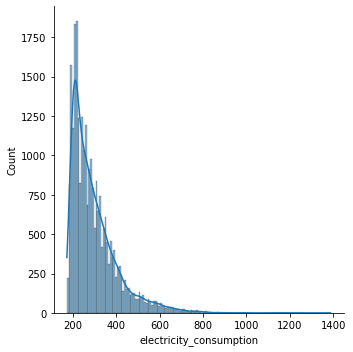

In [85]:
# Skew - Assimetria
# Kurtosis - Curtose - Achatamento

print(train.electricity_consumption.skew()) # Skew > 0, right asymmetry - Skew < 0, left asymmetry 
print(train.electricity_consumption.kurt()) # Kurtosis obtained using Fisher’s definition of kurtosis (kurtosis of normal == 0.0). > 0 Mais achatada

plt.figure(figsize=(12,8))

sns.displot(train, x='electricity_consumption', kde=True)

<AxesSubplot:xlabel='electricity_consumption'>

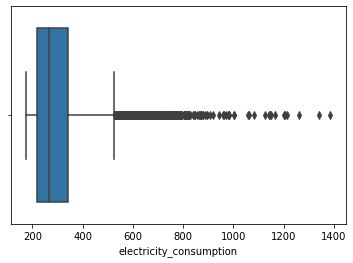

In [86]:
sns.boxplot(data=train, x='electricity_consumption')

In [96]:
train["datetime"] = pd.to_datetime(train["datetime"])

train = train.sort_values(by="datetime")

fig = px.line(train, x="datetime", y="electricity_consumption")

fig.update_traces(line=dict(width=1))
fig.update_layout(
    title=f"Electricity Consumption (kW) over time [{train.datetime.dt.year.min()} - {train.datetime.dt.year.max()}]",
    xaxis_title="Hour",
    yaxis_title="Energy Consumption (kW)")

**Outliers**

Vamos realizar o plot apenas dos outliers para entender quando eles ocorrem. Neste caso utilizamos uma abordagem de Intervalos Interquartil

In [18]:
Q3 = np.quantile(train["electricity_consumption"], 0.75)
Q1 = np.quantile(train["electricity_consumption"], 0.25)
IQR = Q3 - Q1

outliers_df = train[train["electricity_consumption"] > Q3 + 1.5* IQR].copy()
outliers_df["month"] = outliers_df["datetime"].dt.month
outliers_df["month_name"] = outliers_df["datetime"].dt.month_name()
outliers_monthly_df = outliers_df.groupby(['month', 'month_name'])["ID"].count().reset_index().rename(
    columns={"ID": "count_id"}).sort_values(by="month")

fig = px.bar(outliers_monthly_df, x="month_name", y="count_id", title="Quantidade de Registros com Alto Consumo (MW) por Mes", text="count_id")

fig.update_layout(xaxis_title="", yaxis_title="Contagem Registros com Alto Consumo")

fig.show()

Prophet

https://www.kaggle.com/janiobachmann/s-p-500-time-series-forecasting-with-prophet?scriptVersionId=9048402

Prophet is Facebook's library for time series forecasting. In my opinion, Prophet works best with datasets that are higely influenced by seasonality (electricity bills, restaurant visitors etc.) However, I wanted to show the simplicity of using Prophet for simple forecasting which is the main aim of this kernel.

In [99]:
prophet = Prophet()

train_ph = train.sort_values(by="datetime")

train_ph, y = train_test_split(train_ph, test_size=0.2, shuffle=False)

ph_df = train_ph[['datetime', 'electricity_consumption']].rename(columns={"datetime": "ds", "electricity_consumption": "y"}).copy()

prophet.fit(ph_df)

future_consumption = prophet.make_future_dataframe(periods=365)

forecast = prophet.predict(future_consumption)

# forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]]

prophet.plot(forecast)

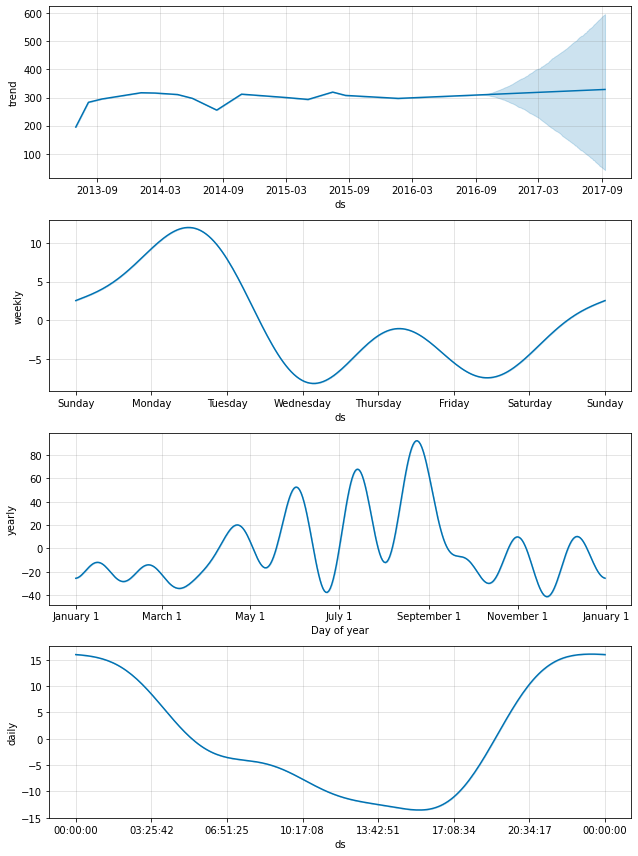

In [24]:
fig = prophet.plot_components(forecast)

Podemos ver que a tendencia da serie eh de estabilidade desde de 2015. Dessa forma não é esperamos que tenha alta tendência esse ano

Semanalmente, vemos que **sabado, domingo, segunda e terca** temos uma demanda maior que nos outros dias. Chamando atencao para o pico entre segunda e terca. Uma variavel de dia da semana pode nos ajudar neste caso

Mensalmente, vemos que os dados tem forte sazonalidade, principalmente, como já visto, na metade do ano. Parece que temos a tendência de nos meses de junho, julho e agosto termos um alto consumo de energia

Já diariamente, vemos que no final do dia e no comeco a demanda geralmente eh mais alta do que no decorrer do dia

In [25]:
predict_df = y.merge(forecast[["ds", "yhat"]], left_on="datetime", right_on="ds")
mean_absolute_percentage_error(predict_df["electricity_consumption"], predict_df["yhat"])

Somente com a variavel de consumo na previsao, e utilizando a sazonalidade, o erro fica alto para o esperado

**Estudo multivariado**

Relacão com variáveis numéricas

In [28]:
px.scatter(train, x='electricity_consumption', y='temperature')

Parece que temos uma leve correlacao negativa entre a temperatura e o consumo de energia. E dados com consumo muito alto sao em temperaturas muito baixas, o que faz sentido por consumo de aquecedor e outros

In [29]:
px.scatter(train, x='electricity_consumption', y='pressure')

Parece que o consumo nao tem muita correlacao com os dados de pressão.

In [30]:
px.scatter(train, x='electricity_consumption', y='windspeed')

In [31]:
px.scatter(train, x='electricity_consumption', y='var1')

Podemos notar que o consumo de energia tem uma leve correlacao com a var1. Em valores mais altos de var 1 tendemos a ter maior consumo de energia em algumns casos

Parece que a velocidade do vento tem uma alta correlacao com o consumo de energia. Quanto maior a velocidade do vento, menor é o consumo.

Isso pode estar ligado a outra matriz energética, eólica, entrando em funcionamento e assim diminuindo o consumo. Nao tivemos informacoes de quais matrizes energeticas sao esse dataframe.

<AxesSubplot:>

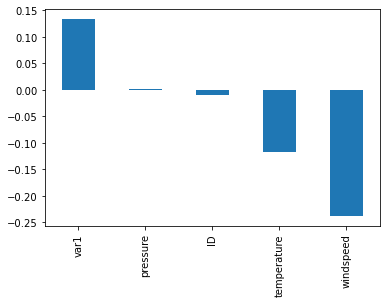

In [32]:
# TODO: check p-value - estatisticamente significante
# Correlacoes

train.corr()["electricity_consumption"].sort_values(ascending=False).iloc[1:].plot.bar()

# Hipoteses

# Uma explicacao para a correlacao negativa com a velocidade do vento alta, eh que a matriz energetica eolica pode produzir
# mais energia e com isso tem uma queda de demanda do dataset

Relacão com variáveis Categoricas

In [33]:
train.dtypes[train.dtypes == 'object']

var2    object
dtype: object

<AxesSubplot:xlabel='var2', ylabel='electricity_consumption'>

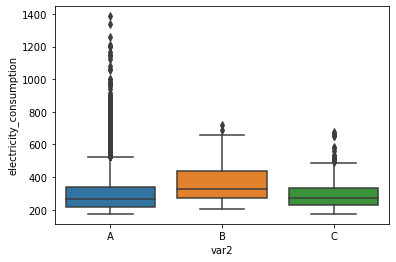

In [34]:
sns.boxplot(data=train, x='var2', y='electricity_consumption')

Parece que a demanda é um pouco maior quando é classificada no grupo B. Porém os grupos C e A sao similares

## **3- Data cleaning**

Checks:

- Tipo de Dados
- Valores Nulos Faltantes
- Repetidos
- Valores Zero/ Discrepantes

In [50]:
# Leitura dos dados
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
# ProfileReport(train)

Preprocess

In [51]:
# Converting to datetime
train["datetime"] = pd.to_datetime(train.datetime)
test["datetime"] = pd.to_datetime(test.datetime)

# Index
train.set_index("datetime", inplace=True)
test.set_index("datetime", inplace=True)

# Check dates completeness

# print(train.index.freq)
# date_range = pd.date_range(train.index.min(), train.index.max(), freq="H")
# print(date_range.difference(train.index))
# print(date_range.difference(train.index).shape)

Features

In [52]:
cols_2lag = ["temperature", "var1", "windspeed"]
# Limite de lags 4 para melhor explicabilidade do modelo
lags = 4
cols_2ma = ["temperature", "var1", "windspeed"]
# Limite de lags 4 para melhor explicabilidade do modelo
mas = 4

# Features Temporais:
train = date_features(train)

# Lag features
train = shift_cols(train, cols_2lag, lags=lags)

# Ma features
train = ma_cols(train, cols_2ma, mas=mas)

# Fourier Features
# Implement

# Filter outliers
train  = remove_outliers(train)

# Transforma cdados categoricos. Isso ajuda no tratamento de alguns modelos e otimiza o processamento
for c in train.dtypes[train.dtypes == 'object'].index: 
    train[c] = train[c].astype('category')

take out  530 outliers


Plots

In [53]:
# _ = train.groupby(["hour", "dow"], as_index=False)["electricity_consumption"].agg('median')

# px.line(_, x="hour", y="electricity_consumption", color="dow")

# fig = px.line(train, x="date", y="electricity_consumption")

# fig.update_layout(title="Energy Consumption (KW) vs. Hour", xaxis_title="Hour", yaxis_title="Energy Consumption")

**4- Modeling**

In [59]:
train_df = train.copy()

SHAP = False
FEATURE_SELECTION = True
APPLY_GRID = False
PLOT_PREDICTION = True
cat_cols =['var2']
PLOT_PREDICTION = True

label = "electricity_consumption"
forbiden = ["ID", "date"]

X = train_df.drop(columns=[label] + forbiden)
y = train_df[label]

X = train_df.drop(columns=[label] + forbiden)
y = train_df[label]

In [55]:
print(train.columns.to_list())

['ID', 'temperature', 'var1', 'pressure', 'windspeed', 'var2', 'electricity_consumption', 'hour', 'dow', 'dom', 'woy', 'month', 'quarter', 'year', 'date', 'temperature_lag_1', 'temperature_lag_2', 'temperature_lag_3', 'temperature_lag_4', 'var1_lag_1', 'var1_lag_2', 'var1_lag_3', 'var1_lag_4', 'windspeed_lag_1', 'windspeed_lag_2', 'windspeed_lag_3', 'windspeed_lag_4', 'temperature_ma_1', 'temperature_ma_2', 'temperature_ma_3', 'temperature_ma_4', 'var1_ma_1', 'var1_ma_2', 'var1_ma_3', 'var1_ma_4', 'windspeed_ma_1', 'windspeed_ma_2', 'windspeed_ma_3', 'windspeed_ma_4']


1- Baseline - Modelo de medias

In [56]:
size = len(y)
y_predict = np.array([y.mean()]*size)
mean_absolute_percentage_error(y, y_predict)

if PLOT_PREDICTION:
    # plot_predict(X_valid, y_valid, predict, "LGBM", hist=True, structure_plot_cols=['hour', 'dom', 'dow', 'year'])
    plot_predict(X, y, y_predict, "Mean")

25.02


2- LightGBM

In [57]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.20, shuffle=False, random_state=False)

In [60]:
%%time

# Testa valores proximos do default
grid = {
    # defalts to 100
    'n_estimators': [10, 20, 30, 40, 100, 200],
    # Taxa de aprendizado muito altas o modelo desce o gradiente muito rapido e pode perder o caminho otimo.
    # Taxas de aprendizado muito pequenas fazem o modelo ficar lento e ir a passos prquenos para o grandiente
    # Colocar em um valor ate o defaults to 0.1
    'learning_rate': [0.01, 0.02, 0.04, 0.08, 0.1],
    # large num_leaves helps improve accuracy but might lead to over-fitting
    'num_leaves': [100, 32, 20, 10],
#     'lambda_l1': 1,  
#     'lambda_l2': 1,
#     'verbose': 100,
#     'min_data_in_leaf': 100,
#     'early_stopping_rounds': [100, 200, 300], 
} 

params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'rmse',
    'verbose': -1,
    'learning_rate': 0.02,
    'n_estimators': 200,
    'num_leaves': 100,
}


if APPLY_GRID:
    print("Starting Grid")
    best_score, best_params = grid_search_tscv(LGBMRegressor(**params), X, y, grid, tscv=10)
    params.update(best_params)
    print(f"Best params {best_params}")
    print("Done")


model = LGBMRegressor(**params)
model.fit(X_train, y_train)
predict = model.predict(X_valid)
mean_absolute_percentage_error(y_valid, predict)

if FEATURE_SELECTION:
    print("start features selector")
    filter_selector = SelectFromModel(model, prefit=True).get_support()
    features = np.array(model.feature_name_)[filter_selector].tolist()
    X_train = X_train[features]
    X_valid = X_valid[features]
    print("Done")

model = LGBMRegressor(**params)
model.fit(X_train, y_train)
predict = model.predict(X_valid)
mean_absolute_percentage_error(y_valid, predict)

if SHAP:
    print("plotting shap")
    plot_shap(model, X_train)

if PLOT_PREDICTION:
    print("plotting predict")
    # plot_predict(X_valid, y_valid, predict, "LGBM", hist=True, structure_plot_cols=['hour', 'dom', 'dow', 'year'])
    plot_predict(X_valid, y_valid, predict, "LGBM")

20.23
start features selector
Done
21.52
plotting predict


CPU times: user 12.5 s, sys: 141 ms, total: 12.7 s
Wall time: 4.09 s


2- Catboost

In [16]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.20, shuffle=False, random_state=False)

Starting Grid
Best paramns {'learning_rate': 0.04, 'n_estimators': 500}
Done
17.37
17.26


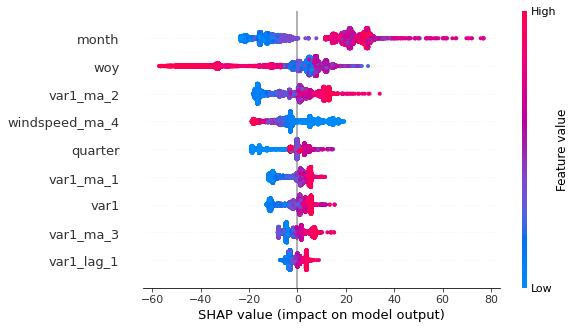

plotting predict


CPU times: user 21min 43s, sys: 2min 4s, total: 23min 48s
Wall time: 8min 42s


In [47]:
%%time

# Testar valores proximos do default
grid = {'n_estimators': [10, 20, 30, 40, 100, 200, 500, 1000], # number of boosting iterations, defalts to 100
        'learning_rate': [0.01, 0.02, 0.04],
#          'num_leaves': [100, 32, 20, 10], # large num_leaves helps improve accuracy but might lead to over-fitting
#         'lambda_l1': 1,  
#         'lambda_l2': 1,
#         'verbose': 100,
#       'min_data_in_leaf': 100,
#         'early_stopping_rounds': [100, 200, 300], 
        } 

params = {
#     'boosting_type': 'Plain',
    'objective': 'MAPE', 'eval_metric': 'MAPE', 'cat_features':cat_cols, 'logging_level': 'Silent',
#   'learning_rate': 0.01, 'n_estimators': 1000
}


if APPLY_GRID:
    print("Starting Grid")
    best_score, best_params = grid_search_tscv(CatBoostRegressor(**params), X, y, grid, tscv=10)
    params.update(best_params)
    print(f"Best paramns {best_params}")
    print("Done")

    
model = CatBoostRegressor(**params)
model.fit(X_train, y_train)
predict = model.predict(X_valid)

mean_absolute_percentage_error(y_valid, predict)

if FEATURE_SELECTION:
    filter_selector = SelectFromModel(model, prefit=True).get_support()
    features = np.array(model.feature_names_)[filter_selector].tolist()
    X_train = X_train[features]
    X_valid = X_valid[features]
    cat_features = train_df.select_dtypes(include=['object']).columns.to_list()
    params.update({'cat_features': cat_features})


model = CatBoostRegressor(**params)
model.fit(X_train, y_train)
predict = model.predict(X_valid)
mean_absolute_percentage_error(y_valid, predict)

if SHAP:
    plot_shap(model, X_train)


if PLOT_PREDICTION:
    print("plotting predict")
    plot_predict(X_valid, y_valid, predict, name_model="Catboost")

3- ANN

documentation: https://www.tensorflow.org/?hl=pt-br
tutorial: https://www.tensorflow.org/tutorials?hl=pt-br

In [62]:
forbiden_ann = ["electricity_consumption", "ID", "date", "var2", "temperature_lag_1", "var1_lag_1", "windspeed_lag_1"]
forbiden_ann = list(set(forbiden_ann + forbiden))

X_ann = train_df.drop(columns=forbiden_ann)

columns_2keep = [c for c in X_ann.columns if ("ma" not in c)]
X_ann = X_ann[columns_2keep]
columns_2keep = [c for c in X_ann.columns if ("lag" not in c)]
X_ann = X_ann[columns_2keep]

X_train, X_valid, y_train, y_valid = train_test_split(X_ann, y, test_size=0.20, shuffle=False, random_state=False)

In [63]:
%%time

epochs = 100

X_train, X_valid, y_train = X_train.values, X_valid.values, y_train.values

# Standard Scaling
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_valid = sc.fit_transform(X_valid)

# Normalizing the target variables
y_train_scaller = (y_train - min(y_train))/ (max(y_train) - min(y_train))

# Initialising the ANN
classifier = Sequential()

# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 10, kernel_initializer = 'uniform', activation = 'relu', input_dim = X_train.shape[1]))

# Adding the second hidden layer
classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu'))

# # Adding the thirth hidden layer
# classifier.add(Dense(units = 3, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the output layer
classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))

# Compiling the ANN
classifier.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['mae'])

# Fitting the ANN to the training set
classifier.fit(X_train, y_train_scaller, batch_size = 10, epochs = epochs)

# Predicting the Test set results
y_pred = classifier.predict(X_valid)
y_pred = (y_pred * (max(y_train) - min(y_train))) + min(y_train)

predictions = [int(elem) for elem in y_pred]

# MAPE
mean_absolute_percentage_error(y_valid, predictions)

if PLOT_PREDICTION:
    plot_predict(X_valid, y_valid, predictions, name_model="ANN")

Epoch 1/10
2078/2078 [==============================] - 3s 996us/step - loss: 0.0467 - mae: 0.1725
Epoch 2/10
2078/2078 [==============================] - 2s 944us/step - loss: 0.0280 - mae: 0.1263
Epoch 3/10
2078/2078 [==============================] - 2s 1ms/step - loss: 0.0271 - mae: 0.1240
Epoch 4/10
2078/2078 [==============================] - 2s 984us/step - loss: 0.0273 - mae: 0.1250
Epoch 5/10
2078/2078 [==============================] - 2s 968us/step - loss: 0.0267 - mae: 0.1228
Epoch 6/10
2078/2078 [==============================] - 3s 1ms/step - loss: 0.0274 - mae: 0.1240
Epoch 7/10
2078/2078 [==============================] - 2s 1ms/step - loss: 0.0265 - mae: 0.1221
Epoch 8/10
2078/2078 [==============================] - 2s 851us/step - loss: 0.0266 - mae: 0.1229
Epoch 9/10
2078/2078 [==============================] - 2s 855us/step - loss: 0.0255 - mae: 0.1191
Epoch 10/10
2078/2078 [==============================] - 2s 1ms/step - loss: 0.0258 - mae: 0.1208
18.93


CPU times: user 28.2 s, sys: 4.67 s, total: 32.8 s
Wall time: 22.4 s
